In [19]:
%matplotlib inline
import matplotlib.pyplot as plt

In [20]:
import os
import numpy as np
import astropy.units as u
from astropy.coordinates import SkyCoord, Angle
from regions import CircleSkyRegion
from gammapy.spectrum import (
    SpectrumDatasetOnOff,
    SpectrumDataset,
    SpectrumDatasetMaker,
)
from gammapy.modeling import Fit, Parameter
from gammapy.modeling.models import (
    PowerLawSpectralModel,
    SpectralModel,
    SkyModel,
    ExpCutoffPowerLawSpectralModel,
)
from gammapy.irf import load_cta_irfs
from gammapy.data import Observation
from gammapy.maps import MapAxis

In [21]:
livetime = 48 * u.h
pointing = SkyCoord(0, 0, unit="deg", frame="galactic")
offset = 0.5 * u.deg
# Reconstructed and true energy axis
energy_axis = MapAxis.from_edges(
    np.logspace(-1.5, 2.0, 10), unit="TeV", name="energy", interp="log"
)
energy_axis_true = MapAxis.from_edges(
    np.logspace(-1.5, 2.0, 31), unit="TeV", name="energy", interp="log"
)

on_region_radius = Angle("0.11 deg")
on_region = CircleSkyRegion(center=pointing, radius=on_region_radius)

In [22]:
# Define spectral model - a simple Power Law in this case
model_simu = ExpCutoffPowerLawSpectralModel(
    index=2.22,
    amplitude=1.289e-12 * u.Unit("cm-2 s-1 TeV-1"),
    reference=1 * u.TeV,
    lambda_=0.01 * u.Unit("TeV-1"),
    alpha = 1,
)
print(model_simu)
# we set the sky model used in the dataset
model = SkyModel(spectral_model=model_simu)

ExpCutoffPowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.289e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.000e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True


In [23]:
os.environ['CALDB'] = '/home/rishank/anaconda2/envs/cta/share/caldb/'
!echo $CALDB
!ls $CALDB

/home/rishank/anaconda2/envs/cta/share/caldb/
data


In [24]:
# Load the IRFs
# In this simulation, we use the CTA-1DC irfs shipped with gammapy.
irfs = load_cta_irfs(
    "$CALDB/data/cta/prod3b-v2/bcf/South_z20_50h/irf_file.fits"
)

In [25]:
obs = Observation.create(pointing=pointing, livetime=livetime, irfs=irfs)
print(obs)

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 172800.0 s



In [26]:
# Make the SpectrumDataset
dataset_empty = SpectrumDataset.create(
    e_reco=energy_axis.edges, e_true=energy_axis_true.edges, region=on_region
)
maker = SpectrumDatasetMaker(selection=["aeff", "edisp", "background"])
dataset = maker.run(dataset_empty, obs)

In [27]:
# Set the model on the dataset, and fake
dataset.model = model
dataset.fake(random_state=42)
print(dataset)

SpectrumDataset

    Name                            : 1 

    Total counts                    : 20280 
    Total predicted counts          : nan
    Total background counts         : 20309.41

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.73e+05 s

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : cash
    Fit statistic value (-2 log(L)) : nan

    Number of parameters            : 0
    Number of free parameters       : 0




In [28]:
dataset_onoff = SpectrumDatasetOnOff(
    aeff=dataset.aeff,
    edisp=dataset.edisp,
    models=model,
    livetime=livetime,
    acceptance=1,
    acceptance_off=5,
)
dataset_onoff.fake(background_model=dataset.background)
print(dataset_onoff)

SpectrumDatasetOnOff

    Name                            :  

    Total counts                    : 37265 
    Total predicted counts          : 37100.54
    Total off counts                : 101957.00

    Total background counts         : 20391.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.50

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0



In [29]:

%%time

n_obs = 10000
datasets = []

for idx in range(n_obs):
    dataset_onoff.fake(random_state=idx, background_model=dataset.background)
    dataset_onoff.name = f"obs_{idx}"
    datasets.append(dataset_onoff.copy())

CPU times: user 36.1 s, sys: 112 ms, total: 36.2 s
Wall time: 36.2 s


In [30]:
print(*datasets, sep = "\n") 

SpectrumDatasetOnOff

    Name                            : obs_0 

    Total counts                    : 37031 
    Total predicted counts          : 37041.14
    Total off counts                : 101660.00

    Total background counts         : 20332.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.12

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1 

    Total counts                    : 36776 
    Total predicted counts          : 36975.54
    Total off counts                : 101332.00

    Total background counts         : 2

SpectrumDatasetOnOff

    Name                            : obs_31 

    Total counts                    : 36750 
    Total predicted counts          : 36930.94
    Total off counts                : 101109.00

    Total background counts         : 20221.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 16.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_32 

    Total counts                    : 37196 
    Total predicted counts          : 37058.34
    Total off counts                : 101746.00

    Total background counts         :

SpectrumDatasetOnOff

    Name                            : obs_60 

    Total counts                    : 36984 
    Total predicted counts          : 37028.14
    Total off counts                : 101595.00

    Total background counts         : 20319.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_61 

    Total counts                    : 37451 
    Total predicted counts          : 36875.94
    Total off counts                : 100834.00

    Total background counts         : 

SpectrumDatasetOnOff

    Name                            : obs_81 

    Total counts                    : 37217 
    Total predicted counts          : 36908.54
    Total off counts                : 100997.00

    Total background counts         : 20199.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 18.27

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_82 

    Total counts                    : 36726 
    Total predicted counts          : 37007.74
    Total off counts                : 101493.00

    Total background counts         :

SpectrumDatasetOnOff

    Name                            : obs_107 

    Total counts                    : 36678 
    Total predicted counts          : 37101.54
    Total off counts                : 101962.00

    Total background counts         : 20392.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.97

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_108 

    Total counts                    : 37210 
    Total predicted counts          : 37050.94
    Total off counts                : 101709.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_135 

    Total counts                    : 37182 
    Total predicted counts          : 36970.54
    Total off counts                : 101307.00

    Total background counts         : 20261.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.73

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_136 

    Total counts                    : 36791 
    Total predicted counts          : 37045.54
    Total off counts                : 101682.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_165 

    Total counts                    : 37323 
    Total predicted counts          : 37100.74
    Total off counts                : 101958.00

    Total background counts         : 20391.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.85

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_166 

    Total counts                    : 37101 
    Total predicted counts          : 37048.14
    Total off counts                : 101695.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_195 

    Total counts                    : 36917 
    Total predicted counts          : 37097.74
    Total off counts                : 101943.00

    Total background counts         : 20388.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.65

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_196 

    Total counts                    : 37076 
    Total predicted counts          : 37039.54
    Total off counts                : 101652.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_226 

    Total counts                    : 36975 
    Total predicted counts          : 37008.94
    Total off counts                : 101499.00

    Total background counts         : 20299.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.65

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_227 

    Total counts                    : 37116 
    Total predicted counts          : 36956.94
    Total off counts                : 101239.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_262 

    Total counts                    : 37127 
    Total predicted counts          : 37041.74
    Total off counts                : 101663.00

    Total background counts         : 20332.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 18.72

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_263 

    Total counts                    : 36912 
    Total predicted counts          : 37029.54
    Total off counts                : 101602.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_295 

    Total counts                    : 37251 
    Total predicted counts          : 36931.94
    Total off counts                : 101114.00

    Total background counts         : 20222.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_296 

    Total counts                    : 37346 
    Total predicted counts          : 37071.94
    Total off counts                : 101814.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_328 

    Total counts                    : 37009 
    Total predicted counts          : 37081.74
    Total off counts                : 101863.00

    Total background counts         : 20372.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.13

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_329 

    Total counts                    : 36812 
    Total predicted counts          : 37049.94
    Total off counts                : 101704.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_364 

    Total counts                    : 37085 
    Total predicted counts          : 37060.54
    Total off counts                : 101757.00

    Total background counts         : 20351.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.47

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_365 

    Total counts                    : 37212 
    Total predicted counts          : 37056.14
    Total off counts                : 101735.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_398 

    Total counts                    : 37211 
    Total predicted counts          : 37120.54
    Total off counts                : 102057.00

    Total background counts         : 20411.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_399 

    Total counts                    : 36841 
    Total predicted counts          : 36968.54
    Total off counts                : 101297.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_433 

    Total counts                    : 37010 
    Total predicted counts          : 37038.34
    Total off counts                : 101646.00

    Total background counts         : 20329.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.94

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_434 

    Total counts                    : 37009 
    Total predicted counts          : 36949.94
    Total off counts                : 101204.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_470 

    Total counts                    : 36933 
    Total predicted counts          : 36912.54
    Total off counts                : 101017.00

    Total background counts         : 20203.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.53

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_471 

    Total counts                    : 36900 
    Total predicted counts          : 37017.14
    Total off counts                : 101540.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_505 

    Total counts                    : 36888 
    Total predicted counts          : 37078.14
    Total off counts                : 101845.00

    Total background counts         : 20369.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.41

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_506 

    Total counts                    : 37100 
    Total predicted counts          : 37017.34
    Total off counts                : 101541.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_541 

    Total counts                    : 36663 
    Total predicted counts          : 36942.14
    Total off counts                : 101165.00

    Total background counts         : 20233.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_542 

    Total counts                    : 36927 
    Total predicted counts          : 36969.14
    Total off counts                : 101300.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_576 

    Total counts                    : 37142 
    Total predicted counts          : 37059.54
    Total off counts                : 101752.00

    Total background counts         : 20350.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_577 

    Total counts                    : 36963 
    Total predicted counts          : 36965.94
    Total off counts                : 101284.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_610 

    Total counts                    : 36884 
    Total predicted counts          : 36989.74
    Total off counts                : 101403.00

    Total background counts         : 20280.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_611 

    Total counts                    : 36936 
    Total predicted counts          : 36949.74
    Total off counts                : 101203.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_647 

    Total counts                    : 37139 
    Total predicted counts          : 37012.94
    Total off counts                : 101519.00

    Total background counts         : 20303.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.49

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_648 

    Total counts                    : 37322 
    Total predicted counts          : 36980.34
    Total off counts                : 101356.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_683 

    Total counts                    : 36905 
    Total predicted counts          : 36967.54
    Total off counts                : 101292.00

    Total background counts         : 20258.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_684 

    Total counts                    : 36939 
    Total predicted counts          : 36981.14
    Total off counts                : 101360.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_718 

    Total counts                    : 36932 
    Total predicted counts          : 37015.94
    Total off counts                : 101534.00

    Total background counts         : 20306.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.79

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_719 

    Total counts                    : 37354 
    Total predicted counts          : 37063.14
    Total off counts                : 101770.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_742 

    Total counts                    : 37100 
    Total predicted counts          : 37054.14
    Total off counts                : 101725.00

    Total background counts         : 20345.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.50

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_743 

    Total counts                    : 36721 
    Total predicted counts          : 36790.94
    Total off counts                : 100409.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_764 

    Total counts                    : 37374 
    Total predicted counts          : 36953.74
    Total off counts                : 101223.00

    Total background counts         : 20244.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.14

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_765 

    Total counts                    : 36869 
    Total predicted counts          : 36994.54
    Total off counts                : 101427.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_799 

    Total counts                    : 37388 
    Total predicted counts          : 36953.14
    Total off counts                : 101220.00

    Total background counts         : 20244.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.66

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_800 

    Total counts                    : 37132 
    Total predicted counts          : 37025.74
    Total off counts                : 101583.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_822 

    Total counts                    : 36978 
    Total predicted counts          : 37034.94
    Total off counts                : 101629.00

    Total background counts         : 20325.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.40

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_823 

    Total counts                    : 37506 
    Total predicted counts          : 36995.94
    Total off counts                : 101434.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_850 

    Total counts                    : 36566 
    Total predicted counts          : 37026.74
    Total off counts                : 101588.00

    Total background counts         : 20317.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_851 

    Total counts                    : 36892 
    Total predicted counts          : 36981.54
    Total off counts                : 101362.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_885 

    Total counts                    : 36554 
    Total predicted counts          : 37021.54
    Total off counts                : 101562.00

    Total background counts         : 20312.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_886 

    Total counts                    : 37051 
    Total predicted counts          : 36992.14
    Total off counts                : 101415.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_920 

    Total counts                    : 37150 
    Total predicted counts          : 37086.74
    Total off counts                : 101888.00

    Total background counts         : 20377.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_921 

    Total counts                    : 37332 
    Total predicted counts          : 37034.74
    Total off counts                : 101628.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_955 

    Total counts                    : 37073 
    Total predicted counts          : 37054.74
    Total off counts                : 101728.00

    Total background counts         : 20345.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.81

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_956 

    Total counts                    : 36865 
    Total predicted counts          : 36950.54
    Total off counts                : 101207.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_992 

    Total counts                    : 37008 
    Total predicted counts          : 36953.54
    Total off counts                : 101222.00

    Total background counts         : 20244.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.77

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_993 

    Total counts                    : 36693 
    Total predicted counts          : 36934.94
    Total off counts                : 101129.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_1028 

    Total counts                    : 37070 
    Total predicted counts          : 36953.14
    Total off counts                : 101220.00

    Total background counts         : 20244.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.52

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1029 

    Total counts                    : 37141 
    Total predicted counts          : 37054.14
    Total off counts                : 101725.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1063 

    Total counts                    : 37035 
    Total predicted counts          : 37037.14
    Total off counts                : 101640.00

    Total background counts         : 20328.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1064 

    Total counts                    : 37104 
    Total predicted counts          : 37153.54
    Total off counts                : 102222.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1097 

    Total counts                    : 37395 
    Total predicted counts          : 37059.14
    Total off counts                : 101750.00

    Total background counts         : 20350.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.81

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1098 

    Total counts                    : 36892 
    Total predicted counts          : 36996.14
    Total off counts                : 101435.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1134 

    Total counts                    : 37153 
    Total predicted counts          : 37099.74
    Total off counts                : 101953.00

    Total background counts         : 20390.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1135 

    Total counts                    : 37122 
    Total predicted counts          : 36987.74
    Total off counts                : 101393.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1169 

    Total counts                    : 36801 
    Total predicted counts          : 36985.14
    Total off counts                : 101380.00

    Total background counts         : 20276.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 21.90

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1170 

    Total counts                    : 37210 
    Total predicted counts          : 36973.14
    Total off counts                : 101320.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1205 

    Total counts                    : 37205 
    Total predicted counts          : 37036.74
    Total off counts                : 101638.00

    Total background counts         : 20327.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.83

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1206 

    Total counts                    : 37036 
    Total predicted counts          : 37129.94
    Total off counts                : 102104.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1241 

    Total counts                    : 36952 
    Total predicted counts          : 37041.14
    Total off counts                : 101660.00

    Total background counts         : 20332.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.34

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1242 

    Total counts                    : 37209 
    Total predicted counts          : 37094.34
    Total off counts                : 101926.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1271 

    Total counts                    : 36868 
    Total predicted counts          : 37022.94
    Total off counts                : 101569.00

    Total background counts         : 20313.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1272 

    Total counts                    : 36863 
    Total predicted counts          : 37006.54
    Total off counts                : 101487.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1307 

    Total counts                    : 36675 
    Total predicted counts          : 37130.74
    Total off counts                : 102108.00

    Total background counts         : 20421.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1308 

    Total counts                    : 36839 
    Total predicted counts          : 36995.74
    Total off counts                : 101433.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1342 

    Total counts                    : 37188 
    Total predicted counts          : 37021.34
    Total off counts                : 101561.00

    Total background counts         : 20312.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1343 

    Total counts                    : 37313 
    Total predicted counts          : 37161.34
    Total off counts                : 102261.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1377 

    Total counts                    : 37203 
    Total predicted counts          : 37143.74
    Total off counts                : 102173.00

    Total background counts         : 20434.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.50

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1378 

    Total counts                    : 36926 
    Total predicted counts          : 36997.14
    Total off counts                : 101440.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1407 

    Total counts                    : 36968 
    Total predicted counts          : 37123.74
    Total off counts                : 102073.00

    Total background counts         : 20414.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1408 

    Total counts                    : 36808 
    Total predicted counts          : 37050.94
    Total off counts                : 101709.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1430 

    Total counts                    : 36491 
    Total predicted counts          : 36862.74
    Total off counts                : 100768.00

    Total background counts         : 20153.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.88

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1431 

    Total counts                    : 37007 
    Total predicted counts          : 37026.34
    Total off counts                : 101586.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1448 

    Total counts                    : 36857 
    Total predicted counts          : 36915.34
    Total off counts                : 101031.00

    Total background counts         : 20206.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1449 

    Total counts                    : 37196 
    Total predicted counts          : 36989.54
    Total off counts                : 101402.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1476 

    Total counts                    : 37099 
    Total predicted counts          : 37002.54
    Total off counts                : 101467.00

    Total background counts         : 20293.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.44

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1477 

    Total counts                    : 37036 
    Total predicted counts          : 37010.14
    Total off counts                : 101505.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1511 

    Total counts                    : 37200 
    Total predicted counts          : 36921.74
    Total off counts                : 101063.00

    Total background counts         : 20212.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.69

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1512 

    Total counts                    : 36981 
    Total predicted counts          : 36934.94
    Total off counts                : 101129.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1535 

    Total counts                    : 37043 
    Total predicted counts          : 37083.74
    Total off counts                : 101873.00

    Total background counts         : 20374.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.53

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1536 

    Total counts                    : 37007 
    Total predicted counts          : 36944.94
    Total off counts                : 101179.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1564 

    Total counts                    : 37038 
    Total predicted counts          : 37007.74
    Total off counts                : 101493.00

    Total background counts         : 20298.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1565 

    Total counts                    : 36804 
    Total predicted counts          : 36973.94
    Total off counts                : 101324.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1597 

    Total counts                    : 37239 
    Total predicted counts          : 37075.14
    Total off counts                : 101830.00

    Total background counts         : 20366.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.29

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1598 

    Total counts                    : 36710 
    Total predicted counts          : 37081.94
    Total off counts                : 101864.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1629 

    Total counts                    : 37103 
    Total predicted counts          : 37167.94
    Total off counts                : 102294.00

    Total background counts         : 20458.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.66

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1630 

    Total counts                    : 37130 
    Total predicted counts          : 37145.54
    Total off counts                : 102182.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1661 

    Total counts                    : 36988 
    Total predicted counts          : 37142.74
    Total off counts                : 102168.00

    Total background counts         : 20433.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.57

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1662 

    Total counts                    : 37078 
    Total predicted counts          : 37185.34
    Total off counts                : 102381.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1691 

    Total counts                    : 37161 
    Total predicted counts          : 36907.74
    Total off counts                : 100993.00

    Total background counts         : 20198.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1692 

    Total counts                    : 36819 
    Total predicted counts          : 36966.14
    Total off counts                : 101285.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1721 

    Total counts                    : 36981 
    Total predicted counts          : 37117.14
    Total off counts                : 102040.00

    Total background counts         : 20408.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.64

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1722 

    Total counts                    : 37275 
    Total predicted counts          : 37028.94
    Total off counts                : 101599.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1752 

    Total counts                    : 37153 
    Total predicted counts          : 37015.14
    Total off counts                : 101530.00

    Total background counts         : 20306.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.47

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1753 

    Total counts                    : 36938 
    Total predicted counts          : 37069.34
    Total off counts                : 101801.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1784 

    Total counts                    : 36925 
    Total predicted counts          : 36902.34
    Total off counts                : 100966.00

    Total background counts         : 20193.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.13

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1785 

    Total counts                    : 37204 
    Total predicted counts          : 37036.94
    Total off counts                : 101639.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1821 

    Total counts                    : 37001 
    Total predicted counts          : 36945.94
    Total off counts                : 101184.00

    Total background counts         : 20236.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.34

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1822 

    Total counts                    : 37008 
    Total predicted counts          : 36938.94
    Total off counts                : 101149.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1855 

    Total counts                    : 36655 
    Total predicted counts          : 36934.34
    Total off counts                : 101126.00

    Total background counts         : 20225.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.90

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1856 

    Total counts                    : 36815 
    Total predicted counts          : 36983.54
    Total off counts                : 101372.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1890 

    Total counts                    : 36900 
    Total predicted counts          : 37010.34
    Total off counts                : 101506.00

    Total background counts         : 20301.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.31

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1891 

    Total counts                    : 36971 
    Total predicted counts          : 37024.94
    Total off counts                : 101579.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1921 

    Total counts                    : 37214 
    Total predicted counts          : 37012.54
    Total off counts                : 101517.00

    Total background counts         : 20303.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.53

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1922 

    Total counts                    : 36943 
    Total predicted counts          : 37021.74
    Total off counts                : 101563.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1952 

    Total counts                    : 37073 
    Total predicted counts          : 37086.14
    Total off counts                : 101885.00

    Total background counts         : 20377.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1953 

    Total counts                    : 37129 
    Total predicted counts          : 37118.34
    Total off counts                : 102046.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1976 

    Total counts                    : 37196 
    Total predicted counts          : 37066.34
    Total off counts                : 101786.00

    Total background counts         : 20357.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.59

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1977 

    Total counts                    : 37140 
    Total predicted counts          : 37053.34
    Total off counts                : 101721.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2009 

    Total counts                    : 36861 
    Total predicted counts          : 37026.34
    Total off counts                : 101586.00

    Total background counts         : 20317.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2010 

    Total counts                    : 36775 
    Total predicted counts          : 37034.54
    Total off counts                : 101627.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2046 

    Total counts                    : 36905 
    Total predicted counts          : 36972.54
    Total off counts                : 101317.00

    Total background counts         : 20263.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.97

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2047 

    Total counts                    : 37083 
    Total predicted counts          : 37044.74
    Total off counts                : 101678.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2083 

    Total counts                    : 37395 
    Total predicted counts          : 37047.74
    Total off counts                : 101693.00

    Total background counts         : 20338.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.25

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2084 

    Total counts                    : 37374 
    Total predicted counts          : 36949.94
    Total off counts                : 101204.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2119 

    Total counts                    : 37123 
    Total predicted counts          : 36884.34
    Total off counts                : 100876.00

    Total background counts         : 20175.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.68

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2120 

    Total counts                    : 36959 
    Total predicted counts          : 37034.74
    Total off counts                : 101628.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2151 

    Total counts                    : 37003 
    Total predicted counts          : 37088.54
    Total off counts                : 101897.00

    Total background counts         : 20379.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2152 

    Total counts                    : 37326 
    Total predicted counts          : 37084.74
    Total off counts                : 101878.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2190 

    Total counts                    : 37322 
    Total predicted counts          : 37074.34
    Total off counts                : 101826.00

    Total background counts         : 20365.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.13

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2191 

    Total counts                    : 37261 
    Total predicted counts          : 37059.74
    Total off counts                : 101753.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2228 

    Total counts                    : 36988 
    Total predicted counts          : 37002.94
    Total off counts                : 101469.00

    Total background counts         : 20293.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2229 

    Total counts                    : 36951 
    Total predicted counts          : 37077.14
    Total off counts                : 101840.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2262 

    Total counts                    : 37117 
    Total predicted counts          : 37020.54
    Total off counts                : 101557.00

    Total background counts         : 20311.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.48

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2263 

    Total counts                    : 36937 
    Total predicted counts          : 37029.54
    Total off counts                : 101602.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2291 

    Total counts                    : 37138 
    Total predicted counts          : 37024.54
    Total off counts                : 101577.00

    Total background counts         : 20315.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.87

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2292 

    Total counts                    : 36802 
    Total predicted counts          : 37100.94
    Total off counts                : 101959.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2316 

    Total counts                    : 37177 
    Total predicted counts          : 36925.14
    Total off counts                : 101080.00

    Total background counts         : 20216.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2317 

    Total counts                    : 37059 
    Total predicted counts          : 36962.34
    Total off counts                : 101266.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2347 

    Total counts                    : 36794 
    Total predicted counts          : 37037.34
    Total off counts                : 101641.00

    Total background counts         : 20328.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.18

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2348 

    Total counts                    : 36846 
    Total predicted counts          : 36934.14
    Total off counts                : 101125.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2383 

    Total counts                    : 37159 
    Total predicted counts          : 37007.34
    Total off counts                : 101491.00

    Total background counts         : 20298.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2384 

    Total counts                    : 36883 
    Total predicted counts          : 37125.14
    Total off counts                : 102080.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2421 

    Total counts                    : 37058 
    Total predicted counts          : 36983.14
    Total off counts                : 101370.00

    Total background counts         : 20274.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.77

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2422 

    Total counts                    : 37020 
    Total predicted counts          : 36958.94
    Total off counts                : 101249.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2457 

    Total counts                    : 37034 
    Total predicted counts          : 37072.94
    Total off counts                : 101819.00

    Total background counts         : 20363.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2458 

    Total counts                    : 36945 
    Total predicted counts          : 36936.14
    Total off counts                : 101135.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2484 

    Total counts                    : 37107 
    Total predicted counts          : 37051.14
    Total off counts                : 101710.00

    Total background counts         : 20342.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.64

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2485 

    Total counts                    : 37018 
    Total predicted counts          : 37117.94
    Total off counts                : 102044.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2517 

    Total counts                    : 37025 
    Total predicted counts          : 36961.94
    Total off counts                : 101264.00

    Total background counts         : 20252.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.43

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2518 

    Total counts                    : 36992 
    Total predicted counts          : 36987.34
    Total off counts                : 101391.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2540 

    Total counts                    : 36932 
    Total predicted counts          : 37065.34
    Total off counts                : 101781.00

    Total background counts         : 20356.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.97

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2541 

    Total counts                    : 37142 
    Total predicted counts          : 37020.94
    Total off counts                : 101559.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2574 

    Total counts                    : 36743 
    Total predicted counts          : 37015.34
    Total off counts                : 101531.00

    Total background counts         : 20306.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 16.77

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2575 

    Total counts                    : 37128 
    Total predicted counts          : 37030.34
    Total off counts                : 101606.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2609 

    Total counts                    : 37145 
    Total predicted counts          : 36961.94
    Total off counts                : 101264.00

    Total background counts         : 20252.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.14

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2610 

    Total counts                    : 36753 
    Total predicted counts          : 37091.74
    Total off counts                : 101913.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2638 

    Total counts                    : 37380 
    Total predicted counts          : 37040.94
    Total off counts                : 101659.00

    Total background counts         : 20331.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2639 

    Total counts                    : 37244 
    Total predicted counts          : 37038.14
    Total off counts                : 101645.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2657 

    Total counts                    : 36902 
    Total predicted counts          : 37045.54
    Total off counts                : 101682.00

    Total background counts         : 20336.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.49

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2658 

    Total counts                    : 36791 
    Total predicted counts          : 36986.34
    Total off counts                : 101386.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2675 

    Total counts                    : 37050 
    Total predicted counts          : 36941.54
    Total off counts                : 101162.00

    Total background counts         : 20232.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.66

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2676 

    Total counts                    : 36794 
    Total predicted counts          : 37000.14
    Total off counts                : 101455.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2698 

    Total counts                    : 36987 
    Total predicted counts          : 36972.34
    Total off counts                : 101316.00

    Total background counts         : 20263.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.25

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2699 

    Total counts                    : 36768 
    Total predicted counts          : 37050.14
    Total off counts                : 101705.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2721 

    Total counts                    : 36641 
    Total predicted counts          : 37018.94
    Total off counts                : 101549.00

    Total background counts         : 20309.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.50

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2722 

    Total counts                    : 36774 
    Total predicted counts          : 37037.74
    Total off counts                : 101643.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2752 

    Total counts                    : 37055 
    Total predicted counts          : 37191.94
    Total off counts                : 102414.00

    Total background counts         : 20482.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.20

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2753 

    Total counts                    : 37469 
    Total predicted counts          : 36969.74
    Total off counts                : 101303.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2790 

    Total counts                    : 36890 
    Total predicted counts          : 37051.54
    Total off counts                : 101712.00

    Total background counts         : 20342.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.19

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2791 

    Total counts                    : 36918 
    Total predicted counts          : 37130.94
    Total off counts                : 102109.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2823 

    Total counts                    : 36949 
    Total predicted counts          : 36955.54
    Total off counts                : 101232.00

    Total background counts         : 20246.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 16.65

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2824 

    Total counts                    : 36987 
    Total predicted counts          : 37069.54
    Total off counts                : 101802.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2854 

    Total counts                    : 37220 
    Total predicted counts          : 36986.14
    Total off counts                : 101385.00

    Total background counts         : 20277.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.28

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2855 

    Total counts                    : 36986 
    Total predicted counts          : 37019.14
    Total off counts                : 101550.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2885 

    Total counts                    : 37218 
    Total predicted counts          : 36997.54
    Total off counts                : 101442.00

    Total background counts         : 20288.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.88

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2886 

    Total counts                    : 37037 
    Total predicted counts          : 37065.14
    Total off counts                : 101780.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2910 

    Total counts                    : 37391 
    Total predicted counts          : 36957.94
    Total off counts                : 101244.00

    Total background counts         : 20248.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.91

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2911 

    Total counts                    : 37222 
    Total predicted counts          : 36935.34
    Total off counts                : 101131.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2945 

    Total counts                    : 37093 
    Total predicted counts          : 37022.94
    Total off counts                : 101569.00

    Total background counts         : 20313.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.14

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2946 

    Total counts                    : 36821 
    Total predicted counts          : 36951.34
    Total off counts                : 101211.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2963 

    Total counts                    : 37058 
    Total predicted counts          : 37030.14
    Total off counts                : 101605.00

    Total background counts         : 20321.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.41

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2964 

    Total counts                    : 37182 
    Total predicted counts          : 37026.74
    Total off counts                : 101588.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2988 

    Total counts                    : 36969 
    Total predicted counts          : 37068.74
    Total off counts                : 101798.00

    Total background counts         : 20359.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.47

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2989 

    Total counts                    : 37029 
    Total predicted counts          : 36991.74
    Total off counts                : 101413.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3015 

    Total counts                    : 36948 
    Total predicted counts          : 37068.54
    Total off counts                : 101797.00

    Total background counts         : 20359.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.14

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3016 

    Total counts                    : 36670 
    Total predicted counts          : 37095.54
    Total off counts                : 101932.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3049 

    Total counts                    : 37419 
    Total predicted counts          : 37054.14
    Total off counts                : 101725.00

    Total background counts         : 20345.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.53

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3050 

    Total counts                    : 36805 
    Total predicted counts          : 36987.94
    Total off counts                : 101394.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3069 

    Total counts                    : 37162 
    Total predicted counts          : 37029.94
    Total off counts                : 101604.00

    Total background counts         : 20320.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.10

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3070 

    Total counts                    : 37063 
    Total predicted counts          : 36972.54
    Total off counts                : 101317.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3094 

    Total counts                    : 37095 
    Total predicted counts          : 37071.54
    Total off counts                : 101812.00

    Total background counts         : 20362.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.43

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3095 

    Total counts                    : 37199 
    Total predicted counts          : 37037.94
    Total off counts                : 101644.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3123 

    Total counts                    : 37170 
    Total predicted counts          : 37122.54
    Total off counts                : 102067.00

    Total background counts         : 20413.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3124 

    Total counts                    : 37058 
    Total predicted counts          : 36958.34
    Total off counts                : 101246.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3147 

    Total counts                    : 37284 
    Total predicted counts          : 37051.34
    Total off counts                : 101711.00

    Total background counts         : 20342.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.14

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3148 

    Total counts                    : 37186 
    Total predicted counts          : 37136.74
    Total off counts                : 102138.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3164 

    Total counts                    : 36997 
    Total predicted counts          : 37111.94
    Total off counts                : 102014.00

    Total background counts         : 20402.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.90

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3165 

    Total counts                    : 36759 
    Total predicted counts          : 36949.94
    Total off counts                : 101204.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3195 

    Total counts                    : 37499 
    Total predicted counts          : 36978.74
    Total off counts                : 101348.00

    Total background counts         : 20269.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3196 

    Total counts                    : 36655 
    Total predicted counts          : 37061.94
    Total off counts                : 101764.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3216 

    Total counts                    : 37367 
    Total predicted counts          : 36958.14
    Total off counts                : 101245.00

    Total background counts         : 20249.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.26

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3217 

    Total counts                    : 37395 
    Total predicted counts          : 37043.74
    Total off counts                : 101673.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3233 

    Total counts                    : 37143 
    Total predicted counts          : 37025.14
    Total off counts                : 101580.00

    Total background counts         : 20316.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.74

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3234 

    Total counts                    : 36693 
    Total predicted counts          : 36968.14
    Total off counts                : 101295.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3251 

    Total counts                    : 36848 
    Total predicted counts          : 36952.74
    Total off counts                : 101218.00

    Total background counts         : 20243.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.20

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3252 

    Total counts                    : 37111 
    Total predicted counts          : 37055.94
    Total off counts                : 101734.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3274 

    Total counts                    : 37279 
    Total predicted counts          : 36965.74
    Total off counts                : 101283.00

    Total background counts         : 20256.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 18.26

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3275 

    Total counts                    : 37309 
    Total predicted counts          : 37058.14
    Total off counts                : 101745.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3290 

    Total counts                    : 37413 
    Total predicted counts          : 36992.54
    Total off counts                : 101417.00

    Total background counts         : 20283.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.73

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3291 

    Total counts                    : 37529 
    Total predicted counts          : 36981.94
    Total off counts                : 101364.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3309 

    Total counts                    : 37035 
    Total predicted counts          : 37011.34
    Total off counts                : 101511.00

    Total background counts         : 20302.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.10

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3310 

    Total counts                    : 37383 
    Total predicted counts          : 36975.74
    Total off counts                : 101333.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3329 

    Total counts                    : 36656 
    Total predicted counts          : 37032.74
    Total off counts                : 101618.00

    Total background counts         : 20323.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.11

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3330 

    Total counts                    : 37007 
    Total predicted counts          : 37132.34
    Total off counts                : 102116.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3355 

    Total counts                    : 37082 
    Total predicted counts          : 36976.94
    Total off counts                : 101339.00

    Total background counts         : 20267.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3356 

    Total counts                    : 37098 
    Total predicted counts          : 37014.94
    Total off counts                : 101529.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3380 

    Total counts                    : 37025 
    Total predicted counts          : 36970.34
    Total off counts                : 101306.00

    Total background counts         : 20261.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.48

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3381 

    Total counts                    : 36944 
    Total predicted counts          : 36977.74
    Total off counts                : 101343.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3401 

    Total counts                    : 37090 
    Total predicted counts          : 36984.14
    Total off counts                : 101375.00

    Total background counts         : 20275.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.33

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3402 

    Total counts                    : 36879 
    Total predicted counts          : 37032.34
    Total off counts                : 101616.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3423 

    Total counts                    : 37265 
    Total predicted counts          : 36903.74
    Total off counts                : 100973.00

    Total background counts         : 20194.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.94

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3424 

    Total counts                    : 37147 
    Total predicted counts          : 37015.34
    Total off counts                : 101531.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3458 

    Total counts                    : 36856 
    Total predicted counts          : 37026.34
    Total off counts                : 101586.00

    Total background counts         : 20317.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.31

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3459 

    Total counts                    : 37196 
    Total predicted counts          : 37024.34
    Total off counts                : 101576.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3481 

    Total counts                    : 37005 
    Total predicted counts          : 37061.14
    Total off counts                : 101760.00

    Total background counts         : 20352.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.77

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3482 

    Total counts                    : 36805 
    Total predicted counts          : 37055.94
    Total off counts                : 101734.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3502 

    Total counts                    : 37106 
    Total predicted counts          : 37012.34
    Total off counts                : 101516.00

    Total background counts         : 20303.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3503 

    Total counts                    : 37049 
    Total predicted counts          : 37060.34
    Total off counts                : 101756.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3530 

    Total counts                    : 37090 
    Total predicted counts          : 37029.54
    Total off counts                : 101602.00

    Total background counts         : 20320.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.86

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3531 

    Total counts                    : 37078 
    Total predicted counts          : 37084.34
    Total off counts                : 101876.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3563 

    Total counts                    : 37134 
    Total predicted counts          : 37092.34
    Total off counts                : 101916.00

    Total background counts         : 20383.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.90

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3564 

    Total counts                    : 36986 
    Total predicted counts          : 37073.34
    Total off counts                : 101821.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3587 

    Total counts                    : 37032 
    Total predicted counts          : 37134.34
    Total off counts                : 102126.00

    Total background counts         : 20425.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.92

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3588 

    Total counts                    : 36934 
    Total predicted counts          : 37061.74
    Total off counts                : 101763.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3612 

    Total counts                    : 36994 
    Total predicted counts          : 37002.94
    Total off counts                : 101469.00

    Total background counts         : 20293.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3613 

    Total counts                    : 36886 
    Total predicted counts          : 37012.94
    Total off counts                : 101519.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3643 

    Total counts                    : 36985 
    Total predicted counts          : 37115.34
    Total off counts                : 102031.00

    Total background counts         : 20406.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.47

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3644 

    Total counts                    : 37093 
    Total predicted counts          : 37038.74
    Total off counts                : 101648.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3673 

    Total counts                    : 37025 
    Total predicted counts          : 36922.54
    Total off counts                : 101067.00

    Total background counts         : 20213.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.52

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3674 

    Total counts                    : 37142 
    Total predicted counts          : 36916.74
    Total off counts                : 101038.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3695 

    Total counts                    : 37172 
    Total predicted counts          : 37118.34
    Total off counts                : 102046.00

    Total background counts         : 20409.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.33

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3696 

    Total counts                    : 36920 
    Total predicted counts          : 37016.14
    Total off counts                : 101535.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3722 

    Total counts                    : 37208 
    Total predicted counts          : 37087.54
    Total off counts                : 101892.00

    Total background counts         : 20378.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.90

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3723 

    Total counts                    : 37033 
    Total predicted counts          : 37008.54
    Total off counts                : 101497.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3743 

    Total counts                    : 37076 
    Total predicted counts          : 36975.74
    Total off counts                : 101333.00

    Total background counts         : 20266.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.92

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3744 

    Total counts                    : 36994 
    Total predicted counts          : 37035.74
    Total off counts                : 101633.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3768 

    Total counts                    : 36658 
    Total predicted counts          : 37064.14
    Total off counts                : 101775.00

    Total background counts         : 20355.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.44

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3769 

    Total counts                    : 37121 
    Total predicted counts          : 37068.34
    Total off counts                : 101796.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3794 

    Total counts                    : 37405 
    Total predicted counts          : 37011.54
    Total off counts                : 101512.00

    Total background counts         : 20302.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3795 

    Total counts                    : 36888 
    Total predicted counts          : 37187.54
    Total off counts                : 102392.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3821 

    Total counts                    : 36862 
    Total predicted counts          : 36921.74
    Total off counts                : 101063.00

    Total background counts         : 20212.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.03

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3822 

    Total counts                    : 37295 
    Total predicted counts          : 37096.94
    Total off counts                : 101939.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3839 

    Total counts                    : 37043 
    Total predicted counts          : 37029.94
    Total off counts                : 101604.00

    Total background counts         : 20320.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.56

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3840 

    Total counts                    : 36935 
    Total predicted counts          : 37065.74
    Total off counts                : 101783.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3860 

    Total counts                    : 37308 
    Total predicted counts          : 36843.14
    Total off counts                : 100670.00

    Total background counts         : 20134.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.16

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3861 

    Total counts                    : 36960 
    Total predicted counts          : 37026.54
    Total off counts                : 101587.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3879 

    Total counts                    : 37049 
    Total predicted counts          : 36902.34
    Total off counts                : 100966.00

    Total background counts         : 20193.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3880 

    Total counts                    : 37137 
    Total predicted counts          : 36998.14
    Total off counts                : 101445.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3900 

    Total counts                    : 37093 
    Total predicted counts          : 36927.74
    Total off counts                : 101093.00

    Total background counts         : 20218.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.05

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3901 

    Total counts                    : 36950 
    Total predicted counts          : 37097.34
    Total off counts                : 101941.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3926 

    Total counts                    : 36892 
    Total predicted counts          : 36994.34
    Total off counts                : 101426.00

    Total background counts         : 20285.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.11

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3927 

    Total counts                    : 37039 
    Total predicted counts          : 37050.54
    Total off counts                : 101707.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3961 

    Total counts                    : 36783 
    Total predicted counts          : 37056.54
    Total off counts                : 101737.00

    Total background counts         : 20347.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.06

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3962 

    Total counts                    : 36927 
    Total predicted counts          : 36991.34
    Total off counts                : 101411.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3997 

    Total counts                    : 37366 
    Total predicted counts          : 37072.94
    Total off counts                : 101819.00

    Total background counts         : 20363.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3998 

    Total counts                    : 36797 
    Total predicted counts          : 37030.54
    Total off counts                : 101607.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4034 

    Total counts                    : 36856 
    Total predicted counts          : 37152.74
    Total off counts                : 102218.00

    Total background counts         : 20443.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.57

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4035 

    Total counts                    : 37152 
    Total predicted counts          : 36879.74
    Total off counts                : 100853.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4070 

    Total counts                    : 36896 
    Total predicted counts          : 37042.74
    Total off counts                : 101668.00

    Total background counts         : 20333.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.57

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4071 

    Total counts                    : 36921 
    Total predicted counts          : 37030.14
    Total off counts                : 101605.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4093 

    Total counts                    : 37254 
    Total predicted counts          : 37042.94
    Total off counts                : 101669.00

    Total background counts         : 20333.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.91

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4094 

    Total counts                    : 36932 
    Total predicted counts          : 37027.34
    Total off counts                : 101591.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4110 

    Total counts                    : 37319 
    Total predicted counts          : 36934.34
    Total off counts                : 101126.00

    Total background counts         : 20225.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.82

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4111 

    Total counts                    : 37314 
    Total predicted counts          : 36962.14
    Total off counts                : 101265.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4140 

    Total counts                    : 37160 
    Total predicted counts          : 37013.74
    Total off counts                : 101523.00

    Total background counts         : 20304.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.48

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4141 

    Total counts                    : 36977 
    Total predicted counts          : 37019.74
    Total off counts                : 101553.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4175 

    Total counts                    : 36847 
    Total predicted counts          : 37080.54
    Total off counts                : 101857.00

    Total background counts         : 20371.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.98

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4176 

    Total counts                    : 37099 
    Total predicted counts          : 37124.14
    Total off counts                : 102075.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4209 

    Total counts                    : 37083 
    Total predicted counts          : 37014.74
    Total off counts                : 101528.00

    Total background counts         : 20305.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.65

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4210 

    Total counts                    : 36871 
    Total predicted counts          : 37039.74
    Total off counts                : 101653.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4245 

    Total counts                    : 37000 
    Total predicted counts          : 37113.74
    Total off counts                : 102023.00

    Total background counts         : 20404.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.52

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4246 

    Total counts                    : 36932 
    Total predicted counts          : 37109.54
    Total off counts                : 102002.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4282 

    Total counts                    : 37138 
    Total predicted counts          : 36885.34
    Total off counts                : 100881.00

    Total background counts         : 20176.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4283 

    Total counts                    : 36909 
    Total predicted counts          : 36937.34
    Total off counts                : 101141.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4313 

    Total counts                    : 37341 
    Total predicted counts          : 36907.14
    Total off counts                : 100990.00

    Total background counts         : 20198.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 17.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4314 

    Total counts                    : 36694 
    Total predicted counts          : 37013.14
    Total off counts                : 101520.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4347 

    Total counts                    : 37119 
    Total predicted counts          : 37076.34
    Total off counts                : 101836.00

    Total background counts         : 20367.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.54

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4348 

    Total counts                    : 36808 
    Total predicted counts          : 37136.54
    Total off counts                : 102137.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4379 

    Total counts                    : 37353 
    Total predicted counts          : 37040.74
    Total off counts                : 101658.00

    Total background counts         : 20331.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.72

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4380 

    Total counts                    : 37094 
    Total predicted counts          : 36904.34
    Total off counts                : 100976.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4416 

    Total counts                    : 37152 
    Total predicted counts          : 37111.54
    Total off counts                : 102012.00

    Total background counts         : 20402.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.61

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4417 

    Total counts                    : 37091 
    Total predicted counts          : 37094.54
    Total off counts                : 101927.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4453 

    Total counts                    : 37235 
    Total predicted counts          : 37014.54
    Total off counts                : 101527.00

    Total background counts         : 20305.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4454 

    Total counts                    : 36866 
    Total predicted counts          : 37127.34
    Total off counts                : 102091.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4488 

    Total counts                    : 37246 
    Total predicted counts          : 36914.34
    Total off counts                : 101026.00

    Total background counts         : 20205.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.66

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4489 

    Total counts                    : 36890 
    Total predicted counts          : 36991.74
    Total off counts                : 101413.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4522 

    Total counts                    : 36830 
    Total predicted counts          : 36952.74
    Total off counts                : 101218.00

    Total background counts         : 20243.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.83

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4523 

    Total counts                    : 37046 
    Total predicted counts          : 36979.94
    Total off counts                : 101354.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4554 

    Total counts                    : 37221 
    Total predicted counts          : 36974.94
    Total off counts                : 101329.00

    Total background counts         : 20265.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.41

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4555 

    Total counts                    : 36975 
    Total predicted counts          : 37008.14
    Total off counts                : 101495.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4583 

    Total counts                    : 37100 
    Total predicted counts          : 36943.74
    Total off counts                : 101173.00

    Total background counts         : 20234.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4584 

    Total counts                    : 37001 
    Total predicted counts          : 36985.94
    Total off counts                : 101384.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4617 

    Total counts                    : 37354 
    Total predicted counts          : 37023.14
    Total off counts                : 101570.00

    Total background counts         : 20314.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 20.87

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4618 

    Total counts                    : 37036 
    Total predicted counts          : 37045.34
    Total off counts                : 101681.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4653 

    Total counts                    : 36586 
    Total predicted counts          : 36922.94
    Total off counts                : 101069.00

    Total background counts         : 20213.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.47

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4654 

    Total counts                    : 37216 
    Total predicted counts          : 37037.34
    Total off counts                : 101641.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4688 

    Total counts                    : 37193 
    Total predicted counts          : 37093.34
    Total off counts                : 101921.00

    Total background counts         : 20384.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4689 

    Total counts                    : 36974 
    Total predicted counts          : 37096.94
    Total off counts                : 101939.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4718 

    Total counts                    : 36975 
    Total predicted counts          : 37068.14
    Total off counts                : 101795.00

    Total background counts         : 20359.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.66

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4719 

    Total counts                    : 37109 
    Total predicted counts          : 37070.34
    Total off counts                : 101806.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4753 

    Total counts                    : 37051 
    Total predicted counts          : 36957.54
    Total off counts                : 101242.00

    Total background counts         : 20248.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4754 

    Total counts                    : 37074 
    Total predicted counts          : 36974.94
    Total off counts                : 101329.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4792 

    Total counts                    : 36919 
    Total predicted counts          : 37082.34
    Total off counts                : 101866.00

    Total background counts         : 20373.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4793 

    Total counts                    : 36829 
    Total predicted counts          : 37070.94
    Total off counts                : 101809.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4831 

    Total counts                    : 37254 
    Total predicted counts          : 37030.14
    Total off counts                : 101605.00

    Total background counts         : 20321.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.59

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4832 

    Total counts                    : 37063 
    Total predicted counts          : 37056.74
    Total off counts                : 101738.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4865 

    Total counts                    : 36566 
    Total predicted counts          : 36991.34
    Total off counts                : 101411.00

    Total background counts         : 20282.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.98

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4866 

    Total counts                    : 37044 
    Total predicted counts          : 37004.54
    Total off counts                : 101477.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4891 

    Total counts                    : 36735 
    Total predicted counts          : 37012.34
    Total off counts                : 101516.00

    Total background counts         : 20303.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.79

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4892 

    Total counts                    : 37139 
    Total predicted counts          : 37021.34
    Total off counts                : 101561.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4914 

    Total counts                    : 36998 
    Total predicted counts          : 37005.94
    Total off counts                : 101484.00

    Total background counts         : 20296.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 16.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4915 

    Total counts                    : 37163 
    Total predicted counts          : 37034.34
    Total off counts                : 101626.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4950 

    Total counts                    : 37063 
    Total predicted counts          : 37096.94
    Total off counts                : 101939.00

    Total background counts         : 20387.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.52

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4951 

    Total counts                    : 37450 
    Total predicted counts          : 37044.74
    Total off counts                : 101678.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4986 

    Total counts                    : 37000 
    Total predicted counts          : 37094.94
    Total off counts                : 101929.00

    Total background counts         : 20385.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.79

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4987 

    Total counts                    : 37325 
    Total predicted counts          : 37059.74
    Total off counts                : 101753.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5022 

    Total counts                    : 36903 
    Total predicted counts          : 37002.54
    Total off counts                : 101467.00

    Total background counts         : 20293.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.86

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5023 

    Total counts                    : 37001 
    Total predicted counts          : 37069.94
    Total off counts                : 101804.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5062 

    Total counts                    : 37047 
    Total predicted counts          : 37055.34
    Total off counts                : 101731.00

    Total background counts         : 20346.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.08

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5063 

    Total counts                    : 37166 
    Total predicted counts          : 36996.34
    Total off counts                : 101436.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5099 

    Total counts                    : 37010 
    Total predicted counts          : 36842.14
    Total off counts                : 100665.00

    Total background counts         : 20133.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5100 

    Total counts                    : 37160 
    Total predicted counts          : 37037.74
    Total off counts                : 101643.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5128 

    Total counts                    : 36672 
    Total predicted counts          : 36883.14
    Total off counts                : 100870.00

    Total background counts         : 20174.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.50

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5129 

    Total counts                    : 37132 
    Total predicted counts          : 37126.14
    Total off counts                : 102085.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5152 

    Total counts                    : 37391 
    Total predicted counts          : 37040.94
    Total off counts                : 101659.00

    Total background counts         : 20331.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.87

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5153 

    Total counts                    : 37094 
    Total predicted counts          : 36864.94
    Total off counts                : 100779.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5172 

    Total counts                    : 36888 
    Total predicted counts          : 37055.14
    Total off counts                : 101730.00

    Total background counts         : 20346.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.59

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5173 

    Total counts                    : 37015 
    Total predicted counts          : 37079.94
    Total off counts                : 101854.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5193 

    Total counts                    : 37025 
    Total predicted counts          : 37071.14
    Total off counts                : 101810.00

    Total background counts         : 20362.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5194 

    Total counts                    : 37039 
    Total predicted counts          : 37041.74
    Total off counts                : 101663.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5214 

    Total counts                    : 37108 
    Total predicted counts          : 37154.34
    Total off counts                : 102226.00

    Total background counts         : 20445.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.10

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5215 

    Total counts                    : 36769 
    Total predicted counts          : 36989.54
    Total off counts                : 101402.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5239 

    Total counts                    : 36664 
    Total predicted counts          : 37021.14
    Total off counts                : 101560.00

    Total background counts         : 20312.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.64

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5240 

    Total counts                    : 37119 
    Total predicted counts          : 36987.34
    Total off counts                : 101391.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5270 

    Total counts                    : 37112 
    Total predicted counts          : 36989.14
    Total off counts                : 101400.00

    Total background counts         : 20280.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.18

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5271 

    Total counts                    : 36740 
    Total predicted counts          : 36939.94
    Total off counts                : 101154.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5302 

    Total counts                    : 37114 
    Total predicted counts          : 37050.14
    Total off counts                : 101705.00

    Total background counts         : 20341.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.33

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5303 

    Total counts                    : 36772 
    Total predicted counts          : 37058.34
    Total off counts                : 101746.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5338 

    Total counts                    : 37349 
    Total predicted counts          : 37039.74
    Total off counts                : 101653.00

    Total background counts         : 20330.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5339 

    Total counts                    : 37193 
    Total predicted counts          : 36968.34
    Total off counts                : 101296.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5374 

    Total counts                    : 36925 
    Total predicted counts          : 37077.94
    Total off counts                : 101844.00

    Total background counts         : 20368.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5375 

    Total counts                    : 37345 
    Total predicted counts          : 36973.34
    Total off counts                : 101321.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5405 

    Total counts                    : 37171 
    Total predicted counts          : 36975.74
    Total off counts                : 101333.00

    Total background counts         : 20266.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.19

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5406 

    Total counts                    : 37141 
    Total predicted counts          : 37022.14
    Total off counts                : 101565.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5430 

    Total counts                    : 37011 
    Total predicted counts          : 37040.74
    Total off counts                : 101658.00

    Total background counts         : 20331.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.77

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5431 

    Total counts                    : 36990 
    Total predicted counts          : 36956.74
    Total off counts                : 101238.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5461 

    Total counts                    : 36730 
    Total predicted counts          : 37029.34
    Total off counts                : 101601.00

    Total background counts         : 20320.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.32

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5462 

    Total counts                    : 37267 
    Total predicted counts          : 37030.74
    Total off counts                : 101608.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5498 

    Total counts                    : 36592 
    Total predicted counts          : 37032.54
    Total off counts                : 101617.00

    Total background counts         : 20323.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.06

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5499 

    Total counts                    : 36759 
    Total predicted counts          : 37014.74
    Total off counts                : 101528.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5534 

    Total counts                    : 37589 
    Total predicted counts          : 37053.94
    Total off counts                : 101724.00

    Total background counts         : 20344.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.48

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5535 

    Total counts                    : 36636 
    Total predicted counts          : 36907.34
    Total off counts                : 100991.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5569 

    Total counts                    : 37113 
    Total predicted counts          : 37178.94
    Total off counts                : 102349.00

    Total background counts         : 20469.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5570 

    Total counts                    : 36934 
    Total predicted counts          : 37006.74
    Total off counts                : 101488.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5603 

    Total counts                    : 36991 
    Total predicted counts          : 37017.14
    Total off counts                : 101540.00

    Total background counts         : 20308.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.13

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5604 

    Total counts                    : 37068 
    Total predicted counts          : 37085.14
    Total off counts                : 101880.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5639 

    Total counts                    : 37050 
    Total predicted counts          : 36849.34
    Total off counts                : 100701.00

    Total background counts         : 20140.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.18

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5640 

    Total counts                    : 36947 
    Total predicted counts          : 37192.74
    Total off counts                : 102418.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5675 

    Total counts                    : 36646 
    Total predicted counts          : 37132.34
    Total off counts                : 102116.00

    Total background counts         : 20423.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5676 

    Total counts                    : 37030 
    Total predicted counts          : 37024.54
    Total off counts                : 101577.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5712 

    Total counts                    : 36968 
    Total predicted counts          : 36944.74
    Total off counts                : 101178.00

    Total background counts         : 20235.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.51

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5713 

    Total counts                    : 36850 
    Total predicted counts          : 37044.74
    Total off counts                : 101678.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5749 

    Total counts                    : 37065 
    Total predicted counts          : 37100.74
    Total off counts                : 101958.00

    Total background counts         : 20391.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.32

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5750 

    Total counts                    : 37055 
    Total predicted counts          : 36943.34
    Total off counts                : 101171.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5782 

    Total counts                    : 36700 
    Total predicted counts          : 36966.54
    Total off counts                : 101287.00

    Total background counts         : 20257.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.72

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5783 

    Total counts                    : 37183 
    Total predicted counts          : 36941.14
    Total off counts                : 101160.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_5810 

    Total counts                    : 36847 
    Total predicted counts          : 36975.34
    Total off counts                : 101331.00

    Total background counts         : 20266.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5811 

    Total counts                    : 36954 
    Total predicted counts          : 36894.74
    Total off counts                : 100928.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5827 

    Total counts                    : 37371 
    Total predicted counts          : 36938.14
    Total off counts                : 101145.00

    Total background counts         : 20229.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.31

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5828 

    Total counts                    : 37166 
    Total predicted counts          : 36911.94
    Total off counts                : 101014.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5849 

    Total counts                    : 37289 
    Total predicted counts          : 37077.74
    Total off counts                : 101843.00

    Total background counts         : 20368.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.33

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5850 

    Total counts                    : 36823 
    Total predicted counts          : 37034.94
    Total off counts                : 101629.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5886 

    Total counts                    : 37192 
    Total predicted counts          : 37087.14
    Total off counts                : 101890.00

    Total background counts         : 20378.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5887 

    Total counts                    : 36760 
    Total predicted counts          : 36982.74
    Total off counts                : 101368.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5908 

    Total counts                    : 37444 
    Total predicted counts          : 37060.94
    Total off counts                : 101759.00

    Total background counts         : 20351.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.81

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5909 

    Total counts                    : 36609 
    Total predicted counts          : 37002.94
    Total off counts                : 101469.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5933 

    Total counts                    : 37024 
    Total predicted counts          : 36954.74
    Total off counts                : 101228.00

    Total background counts         : 20245.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.39

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5934 

    Total counts                    : 36772 
    Total predicted counts          : 37050.54
    Total off counts                : 101707.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5968 

    Total counts                    : 37036 
    Total predicted counts          : 37015.14
    Total off counts                : 101530.00

    Total background counts         : 20306.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.12

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5969 

    Total counts                    : 36973 
    Total predicted counts          : 37121.94
    Total off counts                : 102064.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6002 

    Total counts                    : 36800 
    Total predicted counts          : 37075.74
    Total off counts                : 101833.00

    Total background counts         : 20366.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.13

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6003 

    Total counts                    : 37145 
    Total predicted counts          : 37014.14
    Total off counts                : 101525.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6029 

    Total counts                    : 36967 
    Total predicted counts          : 37080.74
    Total off counts                : 101858.00

    Total background counts         : 20371.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6030 

    Total counts                    : 36999 
    Total predicted counts          : 37055.34
    Total off counts                : 101731.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6064 

    Total counts                    : 37133 
    Total predicted counts          : 37005.14
    Total off counts                : 101480.00

    Total background counts         : 20296.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.64

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6065 

    Total counts                    : 36918 
    Total predicted counts          : 37095.14
    Total off counts                : 101930.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6098 

    Total counts                    : 36903 
    Total predicted counts          : 37028.54
    Total off counts                : 101597.00

    Total background counts         : 20319.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6099 

    Total counts                    : 37283 
    Total predicted counts          : 37091.54
    Total off counts                : 101912.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6134 

    Total counts                    : 36992 
    Total predicted counts          : 37041.34
    Total off counts                : 101661.00

    Total background counts         : 20332.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.77

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6135 

    Total counts                    : 36907 
    Total predicted counts          : 36995.94
    Total off counts                : 101434.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6168 

    Total counts                    : 36777 
    Total predicted counts          : 37029.74
    Total off counts                : 101603.00

    Total background counts         : 20320.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.73

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6169 

    Total counts                    : 36912 
    Total predicted counts          : 37057.14
    Total off counts                : 101740.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6202 

    Total counts                    : 36862 
    Total predicted counts          : 37113.34
    Total off counts                : 102021.00

    Total background counts         : 20404.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.31

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6203 

    Total counts                    : 37250 
    Total predicted counts          : 37063.74
    Total off counts                : 101773.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6234 

    Total counts                    : 37026 
    Total predicted counts          : 36949.94
    Total off counts                : 101204.00

    Total background counts         : 20240.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.69

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6235 

    Total counts                    : 36931 
    Total predicted counts          : 36972.94
    Total off counts                : 101319.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6263 

    Total counts                    : 36873 
    Total predicted counts          : 37073.94
    Total off counts                : 101824.00

    Total background counts         : 20364.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6264 

    Total counts                    : 37037 
    Total predicted counts          : 37082.14
    Total off counts                : 101865.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6286 

    Total counts                    : 37301 
    Total predicted counts          : 37002.34
    Total off counts                : 101466.00

    Total background counts         : 20293.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6287 

    Total counts                    : 36610 
    Total predicted counts          : 36983.94
    Total off counts                : 101374.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6310 

    Total counts                    : 36901 
    Total predicted counts          : 37049.74
    Total off counts                : 101703.00

    Total background counts         : 20340.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.16

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6311 

    Total counts                    : 36621 
    Total predicted counts          : 37085.94
    Total off counts                : 101884.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6337 

    Total counts                    : 36933 
    Total predicted counts          : 37031.74
    Total off counts                : 101613.00

    Total background counts         : 20322.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6338 

    Total counts                    : 36775 
    Total predicted counts          : 37071.34
    Total off counts                : 101811.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6362 

    Total counts                    : 37016 
    Total predicted counts          : 36902.14
    Total off counts                : 100965.00

    Total background counts         : 20193.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.35

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6363 

    Total counts                    : 36803 
    Total predicted counts          : 37023.34
    Total off counts                : 101571.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6386 

    Total counts                    : 37397 
    Total predicted counts          : 36936.34
    Total off counts                : 101136.00

    Total background counts         : 20227.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 24.25

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6387 

    Total counts                    : 36923 
    Total predicted counts          : 37053.74
    Total off counts                : 101723.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6421 

    Total counts                    : 36684 
    Total predicted counts          : 37109.94
    Total off counts                : 102004.00

    Total background counts         : 20400.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.69

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6422 

    Total counts                    : 36915 
    Total predicted counts          : 37061.34
    Total off counts                : 101761.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6449 

    Total counts                    : 37156 
    Total predicted counts          : 36927.74
    Total off counts                : 101093.00

    Total background counts         : 20218.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.34

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6450 

    Total counts                    : 37034 
    Total predicted counts          : 37190.54
    Total off counts                : 102407.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6481 

    Total counts                    : 37043 
    Total predicted counts          : 36852.34
    Total off counts                : 100716.00

    Total background counts         : 20143.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.85

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6482 

    Total counts                    : 36887 
    Total predicted counts          : 37056.94
    Total off counts                : 101739.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6513 

    Total counts                    : 36970 
    Total predicted counts          : 36967.74
    Total off counts                : 101293.00

    Total background counts         : 20258.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.04

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6514 

    Total counts                    : 37154 
    Total predicted counts          : 37022.54
    Total off counts                : 101567.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6547 

    Total counts                    : 37129 
    Total predicted counts          : 37125.74
    Total off counts                : 102083.00

    Total background counts         : 20416.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6548 

    Total counts                    : 36973 
    Total predicted counts          : 37052.14
    Total off counts                : 101715.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6581 

    Total counts                    : 36988 
    Total predicted counts          : 36912.54
    Total off counts                : 101017.00

    Total background counts         : 20203.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.75

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6582 

    Total counts                    : 37025 
    Total predicted counts          : 36951.94
    Total off counts                : 101214.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6611 

    Total counts                    : 36989 
    Total predicted counts          : 37022.14
    Total off counts                : 101565.00

    Total background counts         : 20313.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.04

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6612 

    Total counts                    : 37082 
    Total predicted counts          : 36962.54
    Total off counts                : 101267.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6638 

    Total counts                    : 37065 
    Total predicted counts          : 36981.74
    Total off counts                : 101363.00

    Total background counts         : 20272.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.56

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6639 

    Total counts                    : 37360 
    Total predicted counts          : 37034.34
    Total off counts                : 101626.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6671 

    Total counts                    : 36933 
    Total predicted counts          : 37113.14
    Total off counts                : 102020.00

    Total background counts         : 20404.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.79

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6672 

    Total counts                    : 37105 
    Total predicted counts          : 37183.34
    Total off counts                : 102371.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6707 

    Total counts                    : 36768 
    Total predicted counts          : 37025.34
    Total off counts                : 101581.00

    Total background counts         : 20316.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.63

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6708 

    Total counts                    : 36980 
    Total predicted counts          : 37070.34
    Total off counts                : 101806.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6740 

    Total counts                    : 36927 
    Total predicted counts          : 37025.34
    Total off counts                : 101581.00

    Total background counts         : 20316.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.32

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6741 

    Total counts                    : 36736 
    Total predicted counts          : 37031.34
    Total off counts                : 101611.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6774 

    Total counts                    : 36916 
    Total predicted counts          : 37048.94
    Total off counts                : 101699.00

    Total background counts         : 20339.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.98

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6775 

    Total counts                    : 37002 
    Total predicted counts          : 37122.54
    Total off counts                : 102067.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6805 

    Total counts                    : 36856 
    Total predicted counts          : 37011.74
    Total off counts                : 101513.00

    Total background counts         : 20302.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.74

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6806 

    Total counts                    : 37319 
    Total predicted counts          : 36913.14
    Total off counts                : 101020.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6839 

    Total counts                    : 36699 
    Total predicted counts          : 37114.54
    Total off counts                : 102027.00

    Total background counts         : 20405.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6840 

    Total counts                    : 37056 
    Total predicted counts          : 37032.34
    Total off counts                : 101616.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6874 

    Total counts                    : 36944 
    Total predicted counts          : 36890.74
    Total off counts                : 100908.00

    Total background counts         : 20181.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.33

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6875 

    Total counts                    : 37205 
    Total predicted counts          : 37028.74
    Total off counts                : 101598.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6899 

    Total counts                    : 36722 
    Total predicted counts          : 36982.54
    Total off counts                : 101367.00

    Total background counts         : 20273.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6900 

    Total counts                    : 36855 
    Total predicted counts          : 37048.34
    Total off counts                : 101696.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6924 

    Total counts                    : 37022 
    Total predicted counts          : 37153.34
    Total off counts                : 102221.00

    Total background counts         : 20444.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 17.47

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6925 

    Total counts                    : 36892 
    Total predicted counts          : 37060.94
    Total off counts                : 101759.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6956 

    Total counts                    : 37017 
    Total predicted counts          : 36970.14
    Total off counts                : 101305.00

    Total background counts         : 20261.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.63

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6957 

    Total counts                    : 36921 
    Total predicted counts          : 37047.54
    Total off counts                : 101692.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6982 

    Total counts                    : 37092 
    Total predicted counts          : 36930.54
    Total off counts                : 101107.00

    Total background counts         : 20221.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.69

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6983 

    Total counts                    : 36861 
    Total predicted counts          : 37217.34
    Total off counts                : 102541.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7011 

    Total counts                    : 37079 
    Total predicted counts          : 37093.34
    Total off counts                : 101921.00

    Total background counts         : 20384.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.63

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7012 

    Total counts                    : 36999 
    Total predicted counts          : 37012.94
    Total off counts                : 101519.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7042 

    Total counts                    : 37146 
    Total predicted counts          : 36932.14
    Total off counts                : 101115.00

    Total background counts         : 20223.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7043 

    Total counts                    : 36880 
    Total predicted counts          : 36976.94
    Total off counts                : 101339.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7074 

    Total counts                    : 36602 
    Total predicted counts          : 37001.54
    Total off counts                : 101462.00

    Total background counts         : 20292.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7075 

    Total counts                    : 37013 
    Total predicted counts          : 37079.54
    Total off counts                : 101852.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7101 

    Total counts                    : 36598 
    Total predicted counts          : 37074.14
    Total off counts                : 101825.00

    Total background counts         : 20365.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.19

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7102 

    Total counts                    : 37073 
    Total predicted counts          : 37101.74
    Total off counts                : 101963.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7132 

    Total counts                    : 37104 
    Total predicted counts          : 37071.74
    Total off counts                : 101813.00

    Total background counts         : 20362.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7133 

    Total counts                    : 37124 
    Total predicted counts          : 36993.54
    Total off counts                : 101422.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7147 

    Total counts                    : 37026 
    Total predicted counts          : 37005.74
    Total off counts                : 101483.00

    Total background counts         : 20296.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.20

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7148 

    Total counts                    : 37286 
    Total predicted counts          : 37021.14
    Total off counts                : 101560.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7170 

    Total counts                    : 36894 
    Total predicted counts          : 36973.14
    Total off counts                : 101320.00

    Total background counts         : 20264.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.72

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7171 

    Total counts                    : 37498 
    Total predicted counts          : 37018.94
    Total off counts                : 101549.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7195 

    Total counts                    : 36830 
    Total predicted counts          : 36892.94
    Total off counts                : 100919.00

    Total background counts         : 20183.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.75

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7196 

    Total counts                    : 37145 
    Total predicted counts          : 37045.94
    Total off counts                : 101684.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7222 

    Total counts                    : 37051 
    Total predicted counts          : 36961.74
    Total off counts                : 101263.00

    Total background counts         : 20252.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.16

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7223 

    Total counts                    : 37022 
    Total predicted counts          : 36976.34
    Total off counts                : 101336.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7241 

    Total counts                    : 37011 
    Total predicted counts          : 36979.94
    Total off counts                : 101354.00

    Total background counts         : 20270.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.80

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7242 

    Total counts                    : 36983 
    Total predicted counts          : 36942.34
    Total off counts                : 101166.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7258 

    Total counts                    : 36950 
    Total predicted counts          : 36928.74
    Total off counts                : 101098.00

    Total background counts         : 20219.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7259 

    Total counts                    : 36700 
    Total predicted counts          : 37050.14
    Total off counts                : 101705.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7284 

    Total counts                    : 37111 
    Total predicted counts          : 36985.74
    Total off counts                : 101383.00

    Total background counts         : 20276.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7285 

    Total counts                    : 36983 
    Total predicted counts          : 37046.34
    Total off counts                : 101686.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7318 

    Total counts                    : 36842 
    Total predicted counts          : 37056.14
    Total off counts                : 101735.00

    Total background counts         : 20347.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.32

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7319 

    Total counts                    : 37110 
    Total predicted counts          : 36954.14
    Total off counts                : 101225.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7345 

    Total counts                    : 37050 
    Total predicted counts          : 37023.14
    Total off counts                : 101570.00

    Total background counts         : 20314.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.88

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7346 

    Total counts                    : 36583 
    Total predicted counts          : 36882.54
    Total off counts                : 100867.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7373 

    Total counts                    : 36913 
    Total predicted counts          : 37047.94
    Total off counts                : 101694.00

    Total background counts         : 20338.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.72

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7374 

    Total counts                    : 37115 
    Total predicted counts          : 37012.34
    Total off counts                : 101516.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7405 

    Total counts                    : 37045 
    Total predicted counts          : 36985.14
    Total off counts                : 101380.00

    Total background counts         : 20276.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.56

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7406 

    Total counts                    : 37130 
    Total predicted counts          : 37054.14
    Total off counts                : 101725.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7435 

    Total counts                    : 37116 
    Total predicted counts          : 37040.74
    Total off counts                : 101658.00

    Total background counts         : 20331.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.18

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7436 

    Total counts                    : 36707 
    Total predicted counts          : 37025.14
    Total off counts                : 101580.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7469 

    Total counts                    : 37109 
    Total predicted counts          : 37107.34
    Total off counts                : 101991.00

    Total background counts         : 20398.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.86

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7470 

    Total counts                    : 37146 
    Total predicted counts          : 37030.74
    Total off counts                : 101608.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7504 

    Total counts                    : 36792 
    Total predicted counts          : 37194.94
    Total off counts                : 102429.00

    Total background counts         : 20485.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7505 

    Total counts                    : 36905 
    Total predicted counts          : 37098.14
    Total off counts                : 101945.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7535 

    Total counts                    : 37097 
    Total predicted counts          : 36997.74
    Total off counts                : 101443.00

    Total background counts         : 20288.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.33

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7536 

    Total counts                    : 37020 
    Total predicted counts          : 36992.14
    Total off counts                : 101415.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7568 

    Total counts                    : 36895 
    Total predicted counts          : 36984.14
    Total off counts                : 101375.00

    Total background counts         : 20275.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.88

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7569 

    Total counts                    : 37006 
    Total predicted counts          : 37041.34
    Total off counts                : 101661.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7598 

    Total counts                    : 36935 
    Total predicted counts          : 37073.34
    Total off counts                : 101821.00

    Total background counts         : 20364.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7599 

    Total counts                    : 37041 
    Total predicted counts          : 37080.34
    Total off counts                : 101856.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7632 

    Total counts                    : 36793 
    Total predicted counts          : 36993.74
    Total off counts                : 101423.00

    Total background counts         : 20284.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.30

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7633 

    Total counts                    : 37129 
    Total predicted counts          : 37106.14
    Total off counts                : 101985.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7666 

    Total counts                    : 36985 
    Total predicted counts          : 36974.54
    Total off counts                : 101327.00

    Total background counts         : 20265.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7667 

    Total counts                    : 36917 
    Total predicted counts          : 36956.94
    Total off counts                : 101239.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7691 

    Total counts                    : 37136 
    Total predicted counts          : 37128.54
    Total off counts                : 102097.00

    Total background counts         : 20419.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.96

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7692 

    Total counts                    : 36882 
    Total predicted counts          : 37069.34
    Total off counts                : 101801.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7724 

    Total counts                    : 37333 
    Total predicted counts          : 36889.34
    Total off counts                : 100901.00

    Total background counts         : 20180.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.66

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7725 

    Total counts                    : 37074 
    Total predicted counts          : 37064.34
    Total off counts                : 101776.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7756 

    Total counts                    : 36942 
    Total predicted counts          : 37023.14
    Total off counts                : 101570.00

    Total background counts         : 20314.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7757 

    Total counts                    : 36879 
    Total predicted counts          : 36964.34
    Total off counts                : 101276.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7783 

    Total counts                    : 37047 
    Total predicted counts          : 37055.54
    Total off counts                : 101732.00

    Total background counts         : 20346.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7784 

    Total counts                    : 37050 
    Total predicted counts          : 37004.74
    Total off counts                : 101478.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7808 

    Total counts                    : 36926 
    Total predicted counts          : 37007.14
    Total off counts                : 101490.00

    Total background counts         : 20298.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.32

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7809 

    Total counts                    : 37275 
    Total predicted counts          : 36886.14
    Total off counts                : 100885.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7836 

    Total counts                    : 37442 
    Total predicted counts          : 37113.74
    Total off counts                : 102023.00

    Total background counts         : 20404.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.66

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7837 

    Total counts                    : 36779 
    Total predicted counts          : 36992.54
    Total off counts                : 101417.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7860 

    Total counts                    : 36908 
    Total predicted counts          : 37081.14
    Total off counts                : 101860.00

    Total background counts         : 20372.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7861 

    Total counts                    : 36710 
    Total predicted counts          : 37090.94
    Total off counts                : 101909.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7881 

    Total counts                    : 37162 
    Total predicted counts          : 37049.54
    Total off counts                : 101702.00

    Total background counts         : 20340.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.42

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7882 

    Total counts                    : 37044 
    Total predicted counts          : 36987.54
    Total off counts                : 101392.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7901 

    Total counts                    : 36937 
    Total predicted counts          : 36919.74
    Total off counts                : 101053.00

    Total background counts         : 20210.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 19.38

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7902 

    Total counts                    : 37020 
    Total predicted counts          : 37018.94
    Total off counts                : 101549.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7920 

    Total counts                    : 37034 
    Total predicted counts          : 37001.34
    Total off counts                : 101461.00

    Total background counts         : 20292.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7921 

    Total counts                    : 36872 
    Total predicted counts          : 37074.34
    Total off counts                : 101826.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7941 

    Total counts                    : 36864 
    Total predicted counts          : 37004.54
    Total off counts                : 101477.00

    Total background counts         : 20295.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.63

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7942 

    Total counts                    : 36787 
    Total predicted counts          : 37035.94
    Total off counts                : 101634.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7961 

    Total counts                    : 36948 
    Total predicted counts          : 36950.74
    Total off counts                : 101208.00

    Total background counts         : 20241.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.57

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7962 

    Total counts                    : 37368 
    Total predicted counts          : 36950.14
    Total off counts                : 101205.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7991 

    Total counts                    : 36495 
    Total predicted counts          : 36927.74
    Total off counts                : 101093.00

    Total background counts         : 20218.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.86

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7992 

    Total counts                    : 36591 
    Total predicted counts          : 37044.74
    Total off counts                : 101678.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8021 

    Total counts                    : 36764 
    Total predicted counts          : 36998.14
    Total off counts                : 101445.00

    Total background counts         : 20289.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.31

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8022 

    Total counts                    : 37035 
    Total predicted counts          : 36964.74
    Total off counts                : 101278.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8047 

    Total counts                    : 37260 
    Total predicted counts          : 37008.74
    Total off counts                : 101498.00

    Total background counts         : 20299.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.57

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8048 

    Total counts                    : 36953 
    Total predicted counts          : 37008.74
    Total off counts                : 101498.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8066 

    Total counts                    : 37197 
    Total predicted counts          : 36947.34
    Total off counts                : 101191.00

    Total background counts         : 20238.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.54

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8067 

    Total counts                    : 37038 
    Total predicted counts          : 36981.74
    Total off counts                : 101363.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8087 

    Total counts                    : 37095 
    Total predicted counts          : 37106.74
    Total off counts                : 101988.00

    Total background counts         : 20397.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.08

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8088 

    Total counts                    : 37009 
    Total predicted counts          : 36913.34
    Total off counts                : 101021.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8115 

    Total counts                    : 36823 
    Total predicted counts          : 37073.34
    Total off counts                : 101821.00

    Total background counts         : 20364.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.27

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8116 

    Total counts                    : 37019 
    Total predicted counts          : 37120.94
    Total off counts                : 102059.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8144 

    Total counts                    : 37084 
    Total predicted counts          : 37044.34
    Total off counts                : 101676.00

    Total background counts         : 20335.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.60

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8145 

    Total counts                    : 36898 
    Total predicted counts          : 37120.14
    Total off counts                : 102055.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8164 

    Total counts                    : 36668 
    Total predicted counts          : 37091.54
    Total off counts                : 101912.00

    Total background counts         : 20382.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.85

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8165 

    Total counts                    : 37157 
    Total predicted counts          : 37061.14
    Total off counts                : 101760.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8186 

    Total counts                    : 37029 
    Total predicted counts          : 37177.54
    Total off counts                : 102342.00

    Total background counts         : 20468.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8187 

    Total counts                    : 37013 
    Total predicted counts          : 37073.94
    Total off counts                : 101824.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8216 

    Total counts                    : 37060 
    Total predicted counts          : 37068.14
    Total off counts                : 101795.00

    Total background counts         : 20359.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.15

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8217 

    Total counts                    : 37203 
    Total predicted counts          : 36939.54
    Total off counts                : 101152.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8245 

    Total counts                    : 36818 
    Total predicted counts          : 36993.14
    Total off counts                : 101420.00

    Total background counts         : 20284.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8246 

    Total counts                    : 36686 
    Total predicted counts          : 37027.94
    Total off counts                : 101594.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8267 

    Total counts                    : 37026 
    Total predicted counts          : 37096.94
    Total off counts                : 101939.00

    Total background counts         : 20387.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.74

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8268 

    Total counts                    : 37343 
    Total predicted counts          : 37032.14
    Total off counts                : 101615.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8284 

    Total counts                    : 37038 
    Total predicted counts          : 37012.74
    Total off counts                : 101518.00

    Total background counts         : 20303.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.56

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8285 

    Total counts                    : 36970 
    Total predicted counts          : 36985.54
    Total off counts                : 101382.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8307 

    Total counts                    : 36734 
    Total predicted counts          : 37093.74
    Total off counts                : 101923.00

    Total background counts         : 20384.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.35

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8308 

    Total counts                    : 36792 
    Total predicted counts          : 36879.54
    Total off counts                : 100852.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8335 

    Total counts                    : 36883 
    Total predicted counts          : 36987.94
    Total off counts                : 101394.00

    Total background counts         : 20278.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.08

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8336 

    Total counts                    : 36668 
    Total predicted counts          : 37028.94
    Total off counts                : 101599.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8357 

    Total counts                    : 37049 
    Total predicted counts          : 37227.94
    Total off counts                : 102594.00

    Total background counts         : 20518.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8358 

    Total counts                    : 36939 
    Total predicted counts          : 36995.34
    Total off counts                : 101431.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8384 

    Total counts                    : 37221 
    Total predicted counts          : 36978.94
    Total off counts                : 101349.00

    Total background counts         : 20269.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.57

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8385 

    Total counts                    : 36835 
    Total predicted counts          : 37007.54
    Total off counts                : 101492.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8411 

    Total counts                    : 36884 
    Total predicted counts          : 37049.14
    Total off counts                : 101700.00

    Total background counts         : 20340.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8412 

    Total counts                    : 37125 
    Total predicted counts          : 37072.14
    Total off counts                : 101815.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8439 

    Total counts                    : 37095 
    Total predicted counts          : 36994.54
    Total off counts                : 101427.00

    Total background counts         : 20285.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.74

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8440 

    Total counts                    : 37071 
    Total predicted counts          : 36985.14
    Total off counts                : 101380.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8463 

    Total counts                    : 37235 
    Total predicted counts          : 37057.94
    Total off counts                : 101744.00

    Total background counts         : 20348.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.46

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8464 

    Total counts                    : 36717 
    Total predicted counts          : 36967.34
    Total off counts                : 101291.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8492 

    Total counts                    : 37342 
    Total predicted counts          : 37082.34
    Total off counts                : 101866.00

    Total background counts         : 20373.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8493 

    Total counts                    : 36771 
    Total predicted counts          : 37012.74
    Total off counts                : 101518.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8517 

    Total counts                    : 36999 
    Total predicted counts          : 36906.14
    Total off counts                : 100985.00

    Total background counts         : 20197.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.86

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8518 

    Total counts                    : 37184 
    Total predicted counts          : 36983.94
    Total off counts                : 101374.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8536 

    Total counts                    : 37096 
    Total predicted counts          : 37025.14
    Total off counts                : 101580.00

    Total background counts         : 20316.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 23.46

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8537 

    Total counts                    : 36809 
    Total predicted counts          : 36971.94
    Total off counts                : 101314.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8559 

    Total counts                    : 37008 
    Total predicted counts          : 37040.54
    Total off counts                : 101657.00

    Total background counts         : 20331.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.18

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8560 

    Total counts                    : 36952 
    Total predicted counts          : 37000.34
    Total off counts                : 101456.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8586 

    Total counts                    : 36966 
    Total predicted counts          : 37045.74
    Total off counts                : 101683.00

    Total background counts         : 20336.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.08

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8587 

    Total counts                    : 36738 
    Total predicted counts          : 37051.34
    Total off counts                : 101711.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8618 

    Total counts                    : 37201 
    Total predicted counts          : 36952.94
    Total off counts                : 101219.00

    Total background counts         : 20243.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8619 

    Total counts                    : 36973 
    Total predicted counts          : 36934.34
    Total off counts                : 101126.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8648 

    Total counts                    : 37128 
    Total predicted counts          : 37010.54
    Total off counts                : 101507.00

    Total background counts         : 20301.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8649 

    Total counts                    : 37359 
    Total predicted counts          : 37029.34
    Total off counts                : 101601.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8679 

    Total counts                    : 36900 
    Total predicted counts          : 37127.54
    Total off counts                : 102092.00

    Total background counts         : 20418.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.05

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8680 

    Total counts                    : 37004 
    Total predicted counts          : 37081.74
    Total off counts                : 101863.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8704 

    Total counts                    : 37049 
    Total predicted counts          : 37084.34
    Total off counts                : 101876.00

    Total background counts         : 20375.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.66

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8705 

    Total counts                    : 37120 
    Total predicted counts          : 37095.74
    Total off counts                : 101933.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8729 

    Total counts                    : 36986 
    Total predicted counts          : 37005.74
    Total off counts                : 101483.00

    Total background counts         : 20296.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.63

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8730 

    Total counts                    : 36668 
    Total predicted counts          : 37134.34
    Total off counts                : 102126.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8745 

    Total counts                    : 37173 
    Total predicted counts          : 37015.94
    Total off counts                : 101534.00

    Total background counts         : 20306.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.18

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8746 

    Total counts                    : 37017 
    Total predicted counts          : 37057.34
    Total off counts                : 101741.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8766 

    Total counts                    : 36805 
    Total predicted counts          : 37122.14
    Total off counts                : 102065.00

    Total background counts         : 20413.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.60

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8767 

    Total counts                    : 36920 
    Total predicted counts          : 36990.14
    Total off counts                : 101405.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8788 

    Total counts                    : 36923 
    Total predicted counts          : 37093.14
    Total off counts                : 101920.00

    Total background counts         : 20384.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.49

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8789 

    Total counts                    : 37213 
    Total predicted counts          : 36955.14
    Total off counts                : 101230.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8807 

    Total counts                    : 36944 
    Total predicted counts          : 37069.54
    Total off counts                : 101802.00

    Total background counts         : 20360.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.35

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8808 

    Total counts                    : 37388 
    Total predicted counts          : 36965.34
    Total off counts                : 101281.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8833 

    Total counts                    : 37375 
    Total predicted counts          : 36933.94
    Total off counts                : 101124.00

    Total background counts         : 20224.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.12

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8834 

    Total counts                    : 36987 
    Total predicted counts          : 36988.34
    Total off counts                : 101396.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8856 

    Total counts                    : 36965 
    Total predicted counts          : 36984.94
    Total off counts                : 101379.00

    Total background counts         : 20275.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.96

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8857 

    Total counts                    : 37216 
    Total predicted counts          : 36940.54
    Total off counts                : 101157.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8874 

    Total counts                    : 37250 
    Total predicted counts          : 37056.54
    Total off counts                : 101737.00

    Total background counts         : 20347.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8875 

    Total counts                    : 37057 
    Total predicted counts          : 37016.94
    Total off counts                : 101539.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8888 

    Total counts                    : 37028 
    Total predicted counts          : 37025.34
    Total off counts                : 101581.00

    Total background counts         : 20316.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.92

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8889 

    Total counts                    : 37133 
    Total predicted counts          : 36975.74
    Total off counts                : 101333.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8908 

    Total counts                    : 36769 
    Total predicted counts          : 36953.74
    Total off counts                : 101223.00

    Total background counts         : 20244.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.34

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8909 

    Total counts                    : 37068 
    Total predicted counts          : 36987.34
    Total off counts                : 101391.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8936 

    Total counts                    : 37082 
    Total predicted counts          : 36949.94
    Total off counts                : 101204.00

    Total background counts         : 20240.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.13

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8937 

    Total counts                    : 37128 
    Total predicted counts          : 36996.54
    Total off counts                : 101437.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8966 

    Total counts                    : 36712 
    Total predicted counts          : 36896.94
    Total off counts                : 100939.00

    Total background counts         : 20187.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.04

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8967 

    Total counts                    : 36931 
    Total predicted counts          : 37066.74
    Total off counts                : 101788.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8995 

    Total counts                    : 37141 
    Total predicted counts          : 36960.34
    Total off counts                : 101256.00

    Total background counts         : 20251.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.83

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8996 

    Total counts                    : 37116 
    Total predicted counts          : 36983.54
    Total off counts                : 101372.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9023 

    Total counts                    : 36779 
    Total predicted counts          : 37097.94
    Total off counts                : 101944.00

    Total background counts         : 20388.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9024 

    Total counts                    : 37203 
    Total predicted counts          : 36968.54
    Total off counts                : 101297.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9049 

    Total counts                    : 37147 
    Total predicted counts          : 36894.14
    Total off counts                : 100925.00

    Total background counts         : 20185.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.14

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9050 

    Total counts                    : 37292 
    Total predicted counts          : 37022.54
    Total off counts                : 101567.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9076 

    Total counts                    : 36839 
    Total predicted counts          : 36932.54
    Total off counts                : 101117.00

    Total background counts         : 20223.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.29

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9077 

    Total counts                    : 37605 
    Total predicted counts          : 36937.34
    Total off counts                : 101141.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9106 

    Total counts                    : 37420 
    Total predicted counts          : 37047.94
    Total off counts                : 101694.00

    Total background counts         : 20338.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 23.77

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9107 

    Total counts                    : 36907 
    Total predicted counts          : 37080.14
    Total off counts                : 101855.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9135 

    Total counts                    : 37121 
    Total predicted counts          : 36936.74
    Total off counts                : 101138.00

    Total background counts         : 20227.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.80

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9136 

    Total counts                    : 37080 
    Total predicted counts          : 37004.74
    Total off counts                : 101478.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9158 

    Total counts                    : 36632 
    Total predicted counts          : 37027.74
    Total off counts                : 101593.00

    Total background counts         : 20318.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.20

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9159 

    Total counts                    : 36896 
    Total predicted counts          : 37096.74
    Total off counts                : 101938.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9188 

    Total counts                    : 37113 
    Total predicted counts          : 37030.54
    Total off counts                : 101607.00

    Total background counts         : 20321.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.08

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9189 

    Total counts                    : 36899 
    Total predicted counts          : 37076.74
    Total off counts                : 101838.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9224 

    Total counts                    : 37212 
    Total predicted counts          : 36948.34
    Total off counts                : 101196.00

    Total background counts         : 20239.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9225 

    Total counts                    : 37106 
    Total predicted counts          : 36941.74
    Total off counts                : 101163.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9260 

    Total counts                    : 37090 
    Total predicted counts          : 37001.34
    Total off counts                : 101461.00

    Total background counts         : 20292.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.82

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9261 

    Total counts                    : 36980 
    Total predicted counts          : 36994.54
    Total off counts                : 101427.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9293 

    Total counts                    : 36924 
    Total predicted counts          : 37002.54
    Total off counts                : 101467.00

    Total background counts         : 20293.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.57

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9294 

    Total counts                    : 37165 
    Total predicted counts          : 37002.74
    Total off counts                : 101468.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9327 

    Total counts                    : 36846 
    Total predicted counts          : 36959.34
    Total off counts                : 101251.00

    Total background counts         : 20250.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.48

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9328 

    Total counts                    : 37191 
    Total predicted counts          : 36913.54
    Total off counts                : 101022.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9357 

    Total counts                    : 37241 
    Total predicted counts          : 36981.74
    Total off counts                : 101363.00

    Total background counts         : 20272.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.18

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9358 

    Total counts                    : 37102 
    Total predicted counts          : 37057.54
    Total off counts                : 101742.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9387 

    Total counts                    : 37250 
    Total predicted counts          : 36994.34
    Total off counts                : 101426.00

    Total background counts         : 20285.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.26

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9388 

    Total counts                    : 36897 
    Total predicted counts          : 37031.54
    Total off counts                : 101612.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9419 

    Total counts                    : 36960 
    Total predicted counts          : 37026.54
    Total off counts                : 101587.00

    Total background counts         : 20317.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.11

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9420 

    Total counts                    : 36772 
    Total predicted counts          : 36973.74
    Total off counts                : 101323.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9449 

    Total counts                    : 36849 
    Total predicted counts          : 37071.54
    Total off counts                : 101812.00

    Total background counts         : 20362.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.72

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9450 

    Total counts                    : 37113 
    Total predicted counts          : 36928.14
    Total off counts                : 101095.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9482 

    Total counts                    : 37081 
    Total predicted counts          : 37004.54
    Total off counts                : 101477.00

    Total background counts         : 20295.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9483 

    Total counts                    : 37052 
    Total predicted counts          : 37048.74
    Total off counts                : 101698.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9516 

    Total counts                    : 37205 
    Total predicted counts          : 37031.54
    Total off counts                : 101612.00

    Total background counts         : 20322.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.56

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9517 

    Total counts                    : 36932 
    Total predicted counts          : 37060.94
    Total off counts                : 101759.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9550 

    Total counts                    : 36936 
    Total predicted counts          : 36948.54
    Total off counts                : 101197.00

    Total background counts         : 20239.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.96

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9551 

    Total counts                    : 37099 
    Total predicted counts          : 37028.14
    Total off counts                : 101595.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9586 

    Total counts                    : 36701 
    Total predicted counts          : 37108.54
    Total off counts                : 101997.00

    Total background counts         : 20399.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.88

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9587 

    Total counts                    : 36839 
    Total predicted counts          : 37162.34
    Total off counts                : 102266.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9620 

    Total counts                    : 37146 
    Total predicted counts          : 37057.74
    Total off counts                : 101743.00

    Total background counts         : 20348.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.46

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9621 

    Total counts                    : 36990 
    Total predicted counts          : 36987.14
    Total off counts                : 101390.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9656 

    Total counts                    : 37003 
    Total predicted counts          : 37051.54
    Total off counts                : 101712.00

    Total background counts         : 20342.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.55

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9657 

    Total counts                    : 36910 
    Total predicted counts          : 36980.74
    Total off counts                : 101358.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9691 

    Total counts                    : 37014 
    Total predicted counts          : 37031.34
    Total off counts                : 101611.00

    Total background counts         : 20322.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.27

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9692 

    Total counts                    : 37004 
    Total predicted counts          : 37099.14
    Total off counts                : 101950.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9728 

    Total counts                    : 37254 
    Total predicted counts          : 36964.54
    Total off counts                : 101277.00

    Total background counts         : 20255.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.32

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9729 

    Total counts                    : 36900 
    Total predicted counts          : 36979.94
    Total off counts                : 101354.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9761 

    Total counts                    : 36805 
    Total predicted counts          : 37010.54
    Total off counts                : 101507.00

    Total background counts         : 20301.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.86

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9762 

    Total counts                    : 37301 
    Total predicted counts          : 36968.34
    Total off counts                : 101296.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9797 

    Total counts                    : 37186 
    Total predicted counts          : 37076.54
    Total off counts                : 101837.00

    Total background counts         : 20367.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.88

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9798 

    Total counts                    : 37006 
    Total predicted counts          : 37101.14
    Total off counts                : 101960.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9834 

    Total counts                    : 37300 
    Total predicted counts          : 37022.54
    Total off counts                : 101567.00

    Total background counts         : 20313.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.08

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9835 

    Total counts                    : 36909 
    Total predicted counts          : 37031.54
    Total off counts                : 101612.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9869 

    Total counts                    : 37107 
    Total predicted counts          : 37047.54
    Total off counts                : 101692.00

    Total background counts         : 20338.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 21.51

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9870 

    Total counts                    : 37338 
    Total predicted counts          : 36941.74
    Total off counts                : 101163.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9905 

    Total counts                    : 36263 
    Total predicted counts          : 37116.14
    Total off counts                : 102035.00

    Total background counts         : 20407.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 26.73

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9906 

    Total counts                    : 36777 
    Total predicted counts          : 37066.94
    Total off counts                : 101789.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9940 

    Total counts                    : 37034 
    Total predicted counts          : 36960.14
    Total off counts                : 101255.00

    Total background counts         : 20251.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.13

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9941 

    Total counts                    : 36970 
    Total predicted counts          : 36932.94
    Total off counts                : 101119.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9975 

    Total counts                    : 37239 
    Total predicted counts          : 36977.74
    Total off counts                : 101343.00

    Total background counts         : 20268.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.98

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9976 

    Total counts                    : 37297 
    Total predicted counts          : 37002.54
    Total off counts                : 101467.00

    Total background counts      

Text(0, 0.5, 'No. of observations')

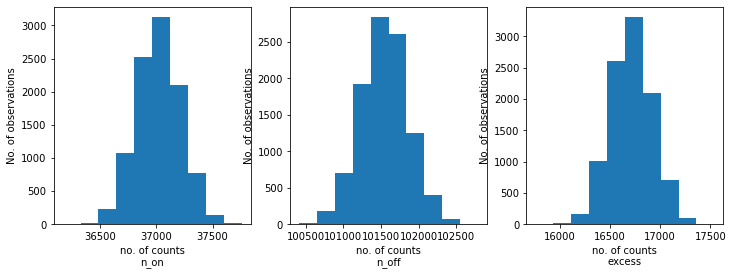

In [31]:

n_on = [dataset.counts.data.sum() for dataset in datasets]
n_off = [dataset.counts_off.data.sum() for dataset in datasets]
excess = [dataset.excess.data.sum() for dataset in datasets]

fix, axes = plt.subplots(1, 3, figsize=(12, 4))
axes[0].hist(n_on)
axes[0].set_xlabel("no. of counts\nn_on")
axes[0].set_ylabel("No. of observations")
axes[1].hist(n_off)
axes[1].set_xlabel("no. of counts\nn_off")
axes[1].set_ylabel("No. of observations")
axes[2].hist(excess)
axes[2].set_xlabel("no. of counts\nexcess");
axes[2].set_ylabel("No. of observations")

In [32]:

%%time
results = []
for dataset in datasets:
    dataset.models = model.copy()
    fit = Fit([dataset])
    result = fit.optimize()
    results.append(
        {
            "index": result.parameters["index"].value,
            "amplitude": result.parameters["amplitude"].value,
            "lambda_": result.parameters["lambda_"].value,
        }
    )

CPU times: user 27min 11s, sys: 2.24 s, total: 27min 13s
Wall time: 27min 26s


In [33]:
results

[{'index': 2.203480656028608,
  'amplitude': 1.319131223495981e-12,
  'lambda_': 0.013352732699866327},
 {'index': 2.216551178307587,
  'amplitude': 1.2725453446582055e-12,
  'lambda_': 0.012480063961532253},
 {'index': 2.2335639880896676,
  'amplitude': 1.2564924970102983e-12,
  'lambda_': 0.0072483906282169285},
 {'index': 2.2237083872295806,
  'amplitude': 1.2773920002908233e-12,
  'lambda_': 0.010494121103543178},
 {'index': 2.23559148008517,
  'amplitude': 1.2791173736763305e-12,
  'lambda_': 0.007843659678971531},
 {'index': 2.218221845526143,
  'amplitude': 1.2812586132237533e-12,
  'lambda_': 0.009791377910732025},
 {'index': 2.226136664494706,
  'amplitude': 1.2713707997318236e-12,
  'lambda_': 0.005722998180854309},
 {'index': 2.2226220144232536,
  'amplitude': 1.275810972118856e-12,
  'lambda_': 0.008042198413201269},
 {'index': 2.2014059217857174,
  'amplitude': 1.3207168628601819e-12,
  'lambda_': 0.016130245144718953},
 {'index': 2.21359023766153,
  'amplitude': 1.2931702

index: 2.2198396438334704 += 0.008943996911168792


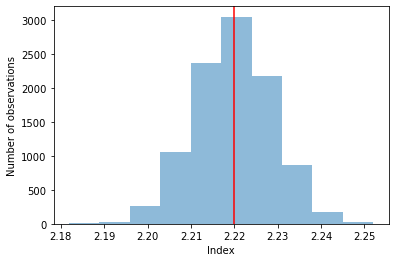

In [34]:
index = np.array([_["index"] for _ in results])
plt.hist(index, bins=10, alpha=0.5)
plt.axvline(x=model_simu.parameters["index"].value, color="red")
plt.xlabel("Index")
plt.ylabel("Number of observations")
print(f"index: {index.mean()} += {index.std()}")

amplitude: 1.2897124207458612e-12 += 1.856881933324629e-14


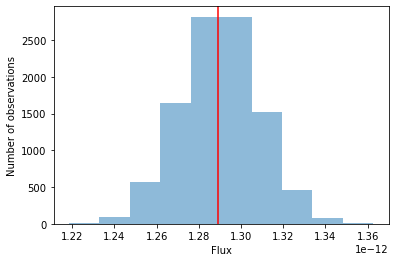

In [35]:
amplitude = np.array([_["amplitude"] for _ in results])
plt.hist(amplitude, bins=10, alpha=0.5)
plt.axvline(x=model_simu.parameters["amplitude"].value, color="red")
plt.xlabel("Flux")
plt.ylabel("Number of observations")
print(f"amplitude: {amplitude.mean()} += {amplitude.std()}")

lambda_: 0.01016104212262641 += 0.002749498281052211


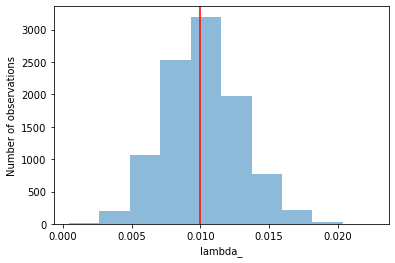

In [36]:
lambda_ = np.array([_["lambda_"] for _ in results])
plt.hist(lambda_, bins=10, alpha=0.5)
plt.axvline(x=model_simu.parameters["lambda_"].value, color="red")
plt.xlabel("lambda_")
plt.ylabel("Number of observations")
print(f"lambda_: {lambda_.mean()} += {lambda_.std()}")